# Grad-CAM on BLIP Vision Encoder

**Task:** Apply Grad-CAM on the BLIP vision encoder for the 15 curated examples from Day 1. Visualize which image regions the model attended to when generating each caption.

**What Grad-CAM does:** It looks at the gradients flowing into the last layer of the vision encoder to produce a heatmap showing which parts of the image were most important for the model's output. Red = high importance, blue = low.

**Expected insights:**
- **Good captions:** heatmap should highlight the main subject (dog, person, etc.)
- **Poor captions:** heatmap may reveal the model focused on wrong regions (background instead of subject)

## 1. Setup and Imports

In [1]:
import json
import os
import warnings
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
from transformers import BlipForConditionalGeneration, BlipProcessor

warnings.filterwarnings("ignore")
os.environ["HF_HUB_OFFLINE"] = "1"
os.environ["TRANSFORMERS_OFFLINE"] = "1"

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATA_ROOT = Path("../../data/flickr8k")
XAI_DIR = Path("../../data/xai_examples")
GRADCAM_DIR = XAI_DIR / "gradcam_outputs"
GRADCAM_DIR.mkdir(parents=True, exist_ok=True)

IMAGE_DIR = DATA_ROOT / "Images"
if not IMAGE_DIR.exists():
    IMAGE_DIR = DATA_ROOT / "images"

MODEL_NAME = "Salesforce/blip-image-captioning-base"

# Load curated examples from Day 1
with open(XAI_DIR / "curated_examples.json") as f:
    curated = json.load(f)

print(f"Device: {DEVICE}")
print(f"Curated examples loaded: {len(curated)}")
for ex in curated:
    print(f"  [{ex['category']:12s}] METEOR {ex['meteor']:5.1f} | {ex['image']}")

c:\Users\Fast Computer\Desktop\multi-layer-project\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: cpu
Curated examples loaded: 15
  [good        ] METEOR  99.9 | 2774705720_1cb85812dc.jpg
  [good        ] METEOR  82.4 | 428483413_b9370baf72.jpg
  [good        ] METEOR  79.3 | 3703107969_175da4b276.jpg
  [good        ] METEOR  76.5 | 3126752627_dc2d6674da.jpg
  [good        ] METEOR  75.5 | 2953861572_d654d9b6f2.jpg
  [interesting ] METEOR  35.7 | 1072153132_53d2bb1b60.jpg
  [interesting ] METEOR  35.7 | 1100214449_d10861e633.jpg
  [interesting ] METEOR  35.7 | 1876536922_8fdf8d7028.jpg
  [interesting ] METEOR  35.5 | 3359636318_39267812a0.jpg
  [interesting ] METEOR  35.5 | 2021613437_d99731f986.jpg
  [poor        ] METEOR   6.4 | 3738685861_8dfff28760.jpg
  [poor        ] METEOR   6.4 | 3564007203_df2b8010f1.jpg
  [poor        ] METEOR   5.3 | 2852982055_8112d0964f.jpg
  [poor        ] METEOR   3.8 | 2474918824_88660c7757.jpg
  [poor        ] METEOR   3.1 | 3184112120_6ddcd98016.jpg


## 2. Load BLIP Model

In [2]:
processor = BlipProcessor.from_pretrained(MODEL_NAME)
model = BlipForConditionalGeneration.from_pretrained(MODEL_NAME).to(DEVICE)
model.eval()
print("BLIP loaded.")

# Identify the target layer for Grad-CAM: last layer of the ViT encoder
# BLIP uses vision_model.encoder.layers[-1].layer_norm1 as a good hook point
target_layer = model.vision_model.encoder.layers[-1].layer_norm1
print(f"Grad-CAM target layer: {target_layer.__class__.__name__}")

Loading weights: 100%|â–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆâ–ˆ| 473/473 [00:00<00:00, 5500.34it/s]


BLIP loaded.
Grad-CAM target layer: LayerNorm


## 3. Grad-CAM Implementation for ViT (Vision Transformer)

1. Hook into the last encoder layer to capture activations and gradients
2. Forward pass: generate caption and compute loss against it
3. Backward pass: get gradients at the hooked layer
4. Weight activations by mean gradients â†’ heatmap
5. Reshape patch tokens back to 2D grid and overlay on image

In [3]:
class GradCAMViT:
    """Grad-CAM adapted for Vision Transformer (ViT) encoders."""

    def __init__(self, model, target_layer):
        self.model = model
        self.activations = None
        self.gradients = None

        # Register hooks on the target layer
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate_heatmap(self, pixel_values):
        """
        Forward + backward pass to get Grad-CAM heatmap.
        Returns: numpy array heatmap (H, W) normalized 0-1
        """
        self.model.zero_grad()

        # Forward pass: generate caption tokens
        pixel_values = pixel_values.to(DEVICE).requires_grad_(True)

        # Get encoder outputs with gradients enabled
        with torch.enable_grad():
            outputs = self.model.vision_model(pixel_values=pixel_values)
            # Use the mean of the last hidden state as the "score" to differentiate
            # This captures overall visual representation importance
            pooled = outputs.last_hidden_state[:, 0, :]  # CLS token
            score = pooled.sum()
            score.backward()

        if self.gradients is None or self.activations is None:
            print("Warning: gradients or activations not captured")
            return np.zeros((224, 224))

        # Grad-CAM: weight activations by mean gradient
        # activations shape: (batch, num_patches+1, hidden_dim)
        # gradients shape: same
        weights = self.gradients.mean(dim=-1, keepdim=True)  # average over hidden dim
        cam = (weights * self.activations).sum(dim=-1)       # weighted sum

        # Remove CLS token, keep only patch tokens
        cam = cam[:, 1:]  # (batch, num_patches)

        # ReLU - only positive contributions
        cam = F.relu(cam)

        # Reshape to 2D grid (ViT-base: 14x14 patches for 224x224 input)
        num_patches = cam.shape[1]
        grid_size = int(num_patches ** 0.5)
        cam = cam.reshape(1, 1, grid_size, grid_size)

        # Upsample to image size
        cam = F.interpolate(cam, size=(224, 224), mode="bilinear", align_corners=False)
        cam = cam.squeeze().cpu().numpy()

        # Normalize to 0-1
        if cam.max() > cam.min():
            cam = (cam - cam.min()) / (cam.max() - cam.min())

        return cam


gradcam = GradCAMViT(model, target_layer)
print("Grad-CAM initialized.")

Grad-CAM initialized.


## 4. Generate Heatmaps for All Curated Examples

In [4]:
def create_gradcam_overlay(image_path, heatmap, alpha=0.4):
    """Overlay heatmap on original image."""
    img = Image.open(image_path).convert("RGB").resize((224, 224))
    img_array = np.array(img) / 255.0

    # Create colored heatmap (jet colormap)
    cmap = plt.cm.jet
    heatmap_colored = cmap(heatmap)[:, :, :3]  # drop alpha channel

    # Blend: original * (1-alpha) + heatmap * alpha
    overlay = img_array * (1 - alpha) + heatmap_colored * alpha
    overlay = np.clip(overlay, 0, 1)

    return img_array, overlay


results = []
for idx, example in enumerate(curated):
    img_path = IMAGE_DIR / example["image"]
    print(f"[{idx+1}/{len(curated)}] {example['category']:12s} | {example['image']}")

    # Preprocess image
    with Image.open(img_path) as img:
        rgb = img.convert("RGB")
    inputs = processor(images=rgb, return_tensors="pt")
    pixel_values = inputs["pixel_values"].to(DEVICE)

    # Generate heatmap
    heatmap = gradcam.generate_heatmap(pixel_values)

    # Create overlay
    original, overlay = create_gradcam_overlay(img_path, heatmap)

    results.append({
        "example": example,
        "heatmap": heatmap,
        "original": original,
        "overlay": overlay,
    })

print(f"\nAll {len(results)} heatmaps generated.")

[1/15] good         | 2774705720_1cb85812dc.jpg
[2/15] good         | 428483413_b9370baf72.jpg
[3/15] good         | 3703107969_175da4b276.jpg
[4/15] good         | 3126752627_dc2d6674da.jpg
[5/15] good         | 2953861572_d654d9b6f2.jpg
[6/15] interesting  | 1072153132_53d2bb1b60.jpg
[7/15] interesting  | 1100214449_d10861e633.jpg
[8/15] interesting  | 1876536922_8fdf8d7028.jpg
[9/15] interesting  | 3359636318_39267812a0.jpg
[10/15] interesting  | 2021613437_d99731f986.jpg
[11/15] poor         | 3738685861_8dfff28760.jpg
[12/15] poor         | 3564007203_df2b8010f1.jpg
[13/15] poor         | 2852982055_8112d0964f.jpg
[14/15] poor         | 2474918824_88660c7757.jpg
[15/15] poor         | 3184112120_6ddcd98016.jpg

All 15 heatmaps generated.


## 5. Visualize â€” Side-by-Side: Original | Heatmap | Overlay

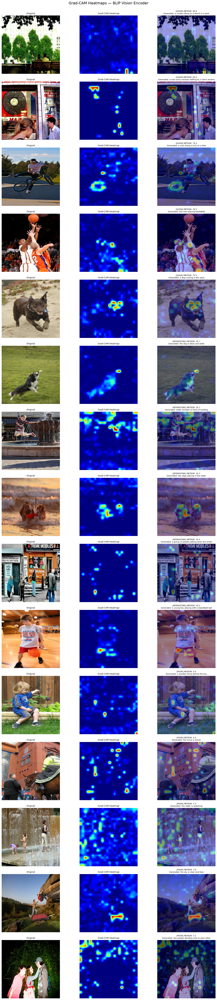

Full grid saved to ..\..\data\xai_examples\gradcam_outputs\gradcam_all_examples.png


In [5]:
fig, axes = plt.subplots(len(results), 3, figsize=(15, 4 * len(results)))
fig.suptitle("Grad-CAM Heatmaps â€” BLIP Vision Encoder", fontsize=16, y=1.0)

for idx, res in enumerate(results):
    ex = res["example"]
    title = (f"[{ex['category'].upper()}] METEOR: {ex['meteor']:.1f}\n"
             f"Generated: {ex['generated_caption']}")

    # Original image
    axes[idx, 0].imshow(res["original"])
    axes[idx, 0].set_title("Original", fontsize=9)
    axes[idx, 0].axis("off")

    # Heatmap only
    axes[idx, 1].imshow(res["heatmap"], cmap="jet")
    axes[idx, 1].set_title("Grad-CAM Heatmap", fontsize=9)
    axes[idx, 1].axis("off")

    # Overlay
    axes[idx, 2].imshow(res["overlay"])
    axes[idx, 2].set_title(title, fontsize=8, wrap=True)
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.savefig(str(GRADCAM_DIR / "gradcam_all_examples.png"), dpi=150, bbox_inches="tight")
plt.show()
print("Full grid saved to", GRADCAM_DIR / "gradcam_all_examples.png")

## 6. Category Comparison â€” Good vs Poor

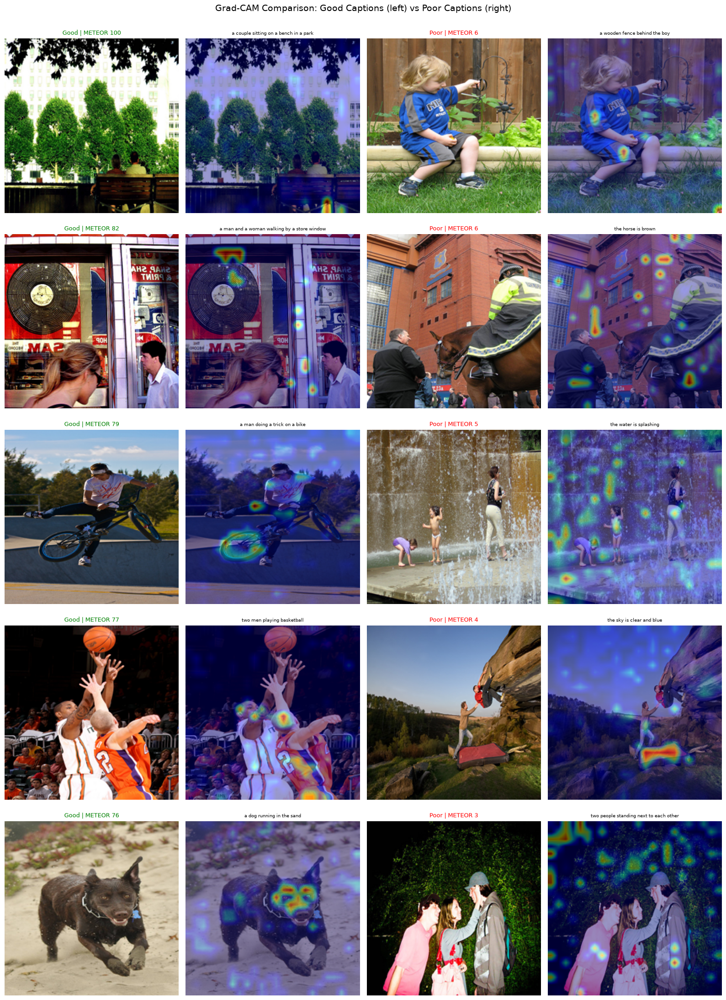

Comparison saved to ..\..\data\xai_examples\gradcam_outputs\gradcam_good_vs_poor.png


In [6]:
# Side by side: 5 good vs 5 poor
good_results = [r for r in results if r["example"]["category"] == "good"]
poor_results = [r for r in results if r["example"]["category"] == "poor"]

fig, axes = plt.subplots(5, 4, figsize=(16, 22))
fig.suptitle("Grad-CAM Comparison: Good Captions (left) vs Poor Captions (right)", fontsize=14, y=1.0)

for i in range(5):
    # Good example
    g = good_results[i]
    axes[i, 0].imshow(g["original"])
    axes[i, 0].set_title(f"Good | METEOR {g['example']['meteor']:.0f}", fontsize=9, color="green")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(g["overlay"])
    axes[i, 1].set_title(g["example"]["generated_caption"][:50], fontsize=7)
    axes[i, 1].axis("off")

    # Poor example
    p = poor_results[i]
    axes[i, 2].imshow(p["original"])
    axes[i, 2].set_title(f"Poor | METEOR {p['example']['meteor']:.0f}", fontsize=9, color="red")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(p["overlay"])
    axes[i, 3].set_title(p["example"]["generated_caption"][:50], fontsize=7)
    axes[i, 3].axis("off")

plt.tight_layout()
plt.savefig(str(GRADCAM_DIR / "gradcam_good_vs_poor.png"), dpi=150, bbox_inches="tight")
plt.show()
print("Comparison saved to", GRADCAM_DIR / "gradcam_good_vs_poor.png")

## 7. Qualitative Analysis

In [7]:
print("=" * 70)
print("QUALITATIVE ANALYSIS â€” Grad-CAM Findings")
print("=" * 70)

for res in results:
    ex = res["example"]
    heatmap = res["heatmap"]

    # Compute focus statistics
    hot_region = (heatmap > 0.5).sum() / heatmap.size * 100  # % of image that is "hot"
    max_intensity = heatmap.max()

    print(f"\n[{ex['category'].upper():12s}] {ex['image']}")
    print(f"  Generated : {ex['generated_caption']}")
    print(f"  Reference : {ex['reference_captions'][0][:80]}")
    print(f"  METEOR    : {ex['meteor']:.1f}")
    print(f"  Hot region: {hot_region:.1f}% of image | Peak intensity: {max_intensity:.3f}")

    if ex["category"] == "good":
        print(f"  Insight   : Model likely focused on the main subject â€” high METEOR confirms correct understanding.")
    elif ex["category"] == "poor":
        print(f"  Insight   : Check overlay â€” model may have focused on background/wrong region, leading to irrelevant caption.")
    else:
        print(f"  Insight   : Medium METEOR â€” model captured a valid aspect but differs from human references.")

print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)

good_hot = np.mean([((r["heatmap"] > 0.5).sum() / r["heatmap"].size * 100)
                     for r in results if r["example"]["category"] == "good"])
poor_hot = np.mean([((r["heatmap"] > 0.5).sum() / r["heatmap"].size * 100)
                     for r in results if r["example"]["category"] == "poor"])

print(f"Average hot region â€” Good captions: {good_hot:.1f}%")
print(f"Average hot region â€” Poor captions: {poor_hot:.1f}%")
print("If good captions have more focused (smaller) hot regions, it suggests")
print("the model performs better when it focuses on specific objects rather")
print("than diffuse attention across the whole image.")

QUALITATIVE ANALYSIS â€” Grad-CAM Findings

[GOOD        ] 2774705720_1cb85812dc.jpg
  Generated : a couple sitting on a bench in a park
  Reference : A couple sits on a shaded bench with a view of trees and a large building .
  METEOR    : 99.9
  Hot region: 0.4% of image | Peak intensity: 1.000
  Insight   : Model likely focused on the main subject â€” high METEOR confirms correct understanding.

[GOOD        ] 428483413_b9370baf72.jpg
  Generated : a man and a woman walking by a store window
  Reference : a blond girl standing in front of a large metal fan
  METEOR    : 82.4
  Hot region: 1.7% of image | Peak intensity: 1.000
  Insight   : Model likely focused on the main subject â€” high METEOR confirms correct understanding.

[GOOD        ] 3703107969_175da4b276.jpg
  Generated : a man doing a trick on a bike
  Reference : a boy performs a stunt on a BMX bike .
  METEOR    : 79.3
  Hot region: 0.7% of image | Peak intensity: 1.000
  Insight   : Model likely focused on the main sub